# Importing Libraries

In [15]:
! pip install ultralytics

In [18]:
import warnings
import numpy as np
from sklearn.model_selection import train_test_split
import os
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import torch
from torchvision import transforms
from ultralytics import YOLO
import torch
import cv2
import os
import cv2
from ultralytics import YOLO
import os
from PIL import Image

# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
!nvidia-smi

warnings.filterwarnings("ignore")

Using device: cuda
Mon May 26 04:18:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   34C    P0             25W /  250W |       3MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+----------------------------

# Visualization

Number of images: 3588
Number of masks: 3588


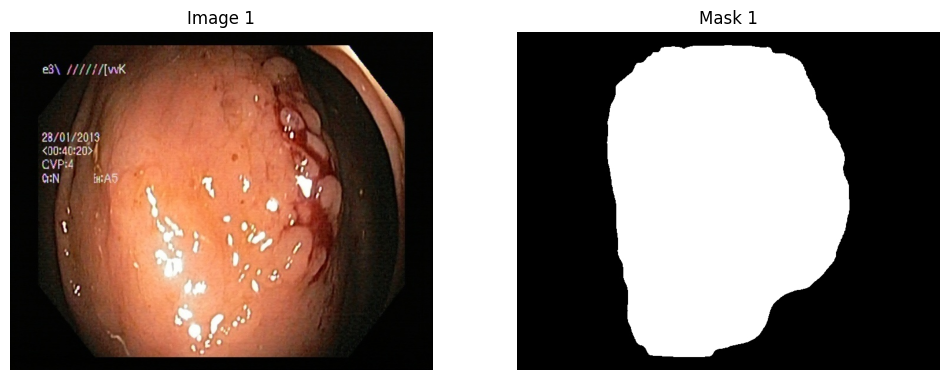

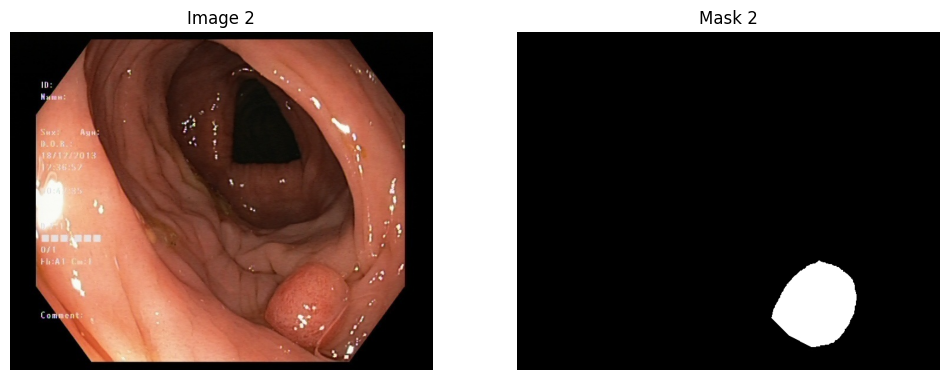

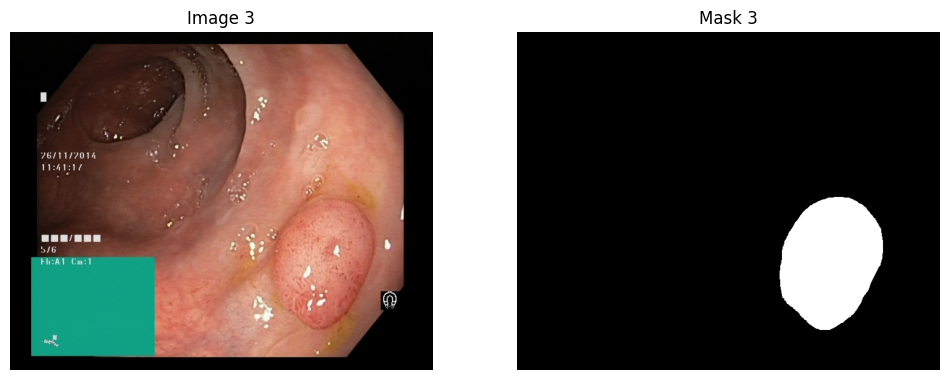

In [19]:
def load_images(image_dir, mask_dir, image_files, mask_files):
    """Loads all images (RGB) and masks (grayscale) into memory as numpy arrays."""
    images = []
    masks = []
    
    for img_file, mask_file in zip(image_files, mask_files):
        image_path = image_dir / img_file
        mask_path = mask_dir / mask_file

        # Open image and ensure it is RGB (3 channels)
        with Image.open(image_path) as image:
            image = image.convert("RGB")  # Ensure RGB
            images.append(np.array(image))  # Convert to numpy array

        # Open mask and ensure it is grayscale (1 channel)
        with Image.open(mask_path) as mask:
            mask = mask.convert("L")  # Convert to grayscale
            masks.append(np.array(mask))  # Convert to numpy array
    
    return images, masks

def display_images(images, masks, num_images=3):
    """Displays a given number of images and their corresponding masks."""
    for i in range(min(num_images, len(images))):  # Ensure we don't exceed available images
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        
        ax[0].imshow(images[i])
        ax[0].set_title(f"Image {i + 1}")
        ax[0].axis('off')

        ax[1].imshow(masks[i], cmap='gray')
        ax[1].set_title(f"Mask {i + 1}")
        ax[1].axis('off')

        plt.show()

# Paths to the image and mask directories
image_dir = Path('/kaggle/input/polypdb-images/images')
mask_dir = Path('/kaggle/input/polypdb-masks/masks')

# List all image files (only .jpg) and mask files (.jpg and .png)
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') and not f.startswith('.')]
mask_files = [f for f in os.listdir(mask_dir) if (f.endswith('.jpg') or f.endswith('.png')) and not f.startswith('.')]

# Sort images and masks by their filename (assuming corresponding filenames)
image_files.sort()
mask_files.sort()

# Print the lengths of both lists to check if they are equal
print(f"Number of images: {len(image_files)}")
print(f"Number of masks: {len(mask_files)}")

# Load all images and masks
images, masks = load_images(image_dir, mask_dir, image_files, mask_files)

# Display a few images
display_images(images, masks, num_images=3)


Train images shape: (2870,), Train masks shape: (2870,)
Validation images shape: (359,), Validation masks shape: (359,)
Test images shape: (359,), Test masks shape: (359,)


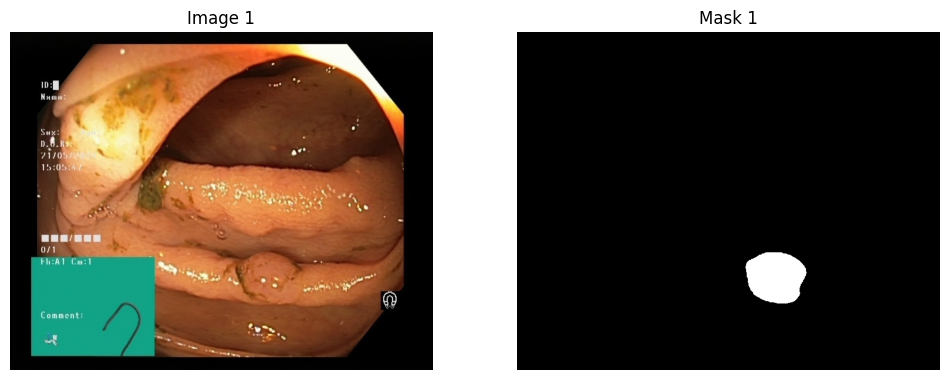

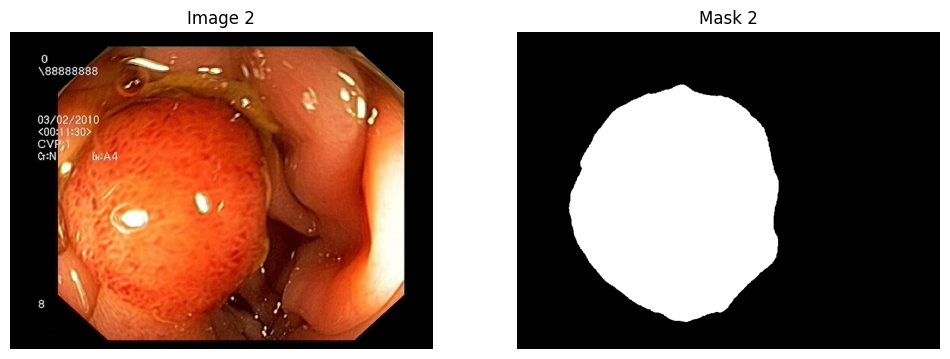

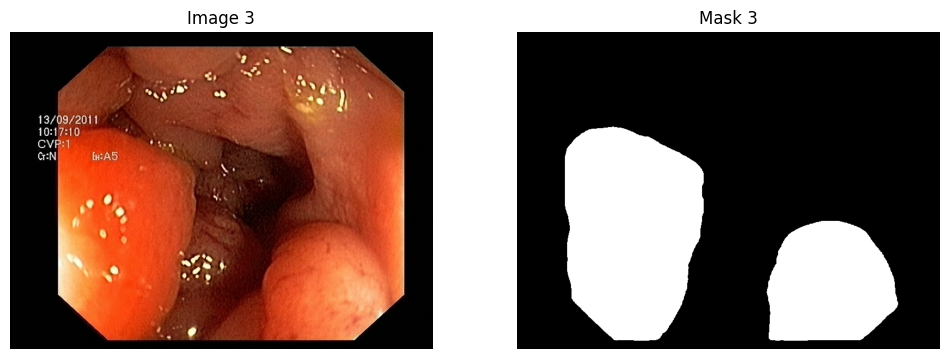

In [20]:
# Convert lists to numpy arrays
images = np.array(images, dtype=object)
masks = np.array(masks, dtype=object)

# Step 1: 80% train, 20% temp (val+test)
images_train, images_temp, masks_train, masks_temp = train_test_split(
    images, masks, test_size=0.2, random_state=42
)

# Step 2: Split temp into 10% val, 10% test (i.e., 50/50 split of 20%)
images_val, images_test, masks_val, masks_test = train_test_split(
    images_temp, masks_temp, test_size=0.5, random_state=42
)

# Check final sizes
print(f"Train images shape: {images_train.shape}, Train masks shape: {masks_train.shape}")
print(f"Validation images shape: {images_val.shape}, Validation masks shape: {masks_val.shape}")
print(f"Test images shape: {images_test.shape}, Test masks shape: {masks_test.shape}")

# Display some training samples
display_images(images_train, masks_train, num_images=3)

# Train-Validation-Test

In [21]:
def save_split(images, masks, split_name, base_path='/kaggle/working/polyp_yolo_dataset'):
    image_dir = os.path.join(base_path, 'images', split_name)
    mask_dir = os.path.join(base_path, 'masks', split_name)
    os.makedirs(image_dir, exist_ok=True)
    os.makedirs(mask_dir, exist_ok=True)

    for idx, (img_arr, mask_arr) in enumerate(zip(images, masks)):
        img = Image.fromarray(img_arr)
        mask = Image.fromarray(mask_arr)

        img.save(os.path.join(image_dir, f'{split_name}_{idx}.jpg'))
        mask.save(os.path.join(mask_dir, f'{split_name}_{idx}.png'))

    print(f"Saved {split_name} set: {len(images)} images and masks.")

# Save all splits
save_split(images_train, masks_train, 'train')
save_split(images_val, masks_val, 'val')
save_split(images_test, masks_test, 'test')


Saved train set: 2870 images and masks.
Saved val set: 359 images and masks.
Saved test set: 359 images and masks.


In [22]:
# --- Convert mask to YOLO format boxes ---
def mask_to_yolo_boxes(mask, image_shape):
    _, binary = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    h, w = image_shape[:2]
    boxes = []
    for cnt in contours:
        x, y, bw, bh = cv2.boundingRect(cnt)
        if bw < 5 or bh < 5:
            continue
        x_c = (x + bw / 2) / w
        y_c = (y + bh / 2) / h
        boxes.append(f"0 {x_c:.6f} {y_c:.6f} {bw/w:.6f} {bh/h:.6f}")
    return boxes

# --- Generate labels for YOLOv9 ---
def generate_labels(image_dir, mask_dir, label_dir):
    os.makedirs(label_dir, exist_ok=True)
    for file in os.listdir(image_dir):
        if not file.endswith('.jpg'):
            continue
        img_path = os.path.join(image_dir, file)
        mask_path = os.path.join(mask_dir, file.replace('.jpg', '.png'))
        label_path = os.path.join(label_dir, file.replace('.jpg', '.txt'))

        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        boxes = mask_to_yolo_boxes(mask, img.shape)
        with open(label_path, 'w') as f:
            f.write('\n'.join(boxes))


In [23]:
# --- Generate labels for all splits ---
generate_labels(
    '/kaggle/working/polyp_yolo_dataset/images/train',
    '/kaggle/working/polyp_yolo_dataset/masks/train',
    '/kaggle/working/polyp_yolo_dataset/labels/train'
)
generate_labels(
    '/kaggle/working/polyp_yolo_dataset/images/val',
    '/kaggle/working/polyp_yolo_dataset/masks/val',
    '/kaggle/working/polyp_yolo_dataset/labels/val'
)
generate_labels(
    '/kaggle/working/polyp_yolo_dataset/images/test',
    '/kaggle/working/polyp_yolo_dataset/masks/test',
    '/kaggle/working/polyp_yolo_dataset/labels/test'
)


# Training Model

In [24]:
# --- Create YOLOv9 data.yaml file ---
data_yaml_path = '/kaggle/working/polyp_yolo_dataset/data.yaml'

with open(data_yaml_path, 'w') as f:
    f.write("""
path: /kaggle/working/polyp_yolo_dataset
train: images/train
val: images/val
test: images/test

nc: 1
names: ['polyp']
""")


In [25]:
run_name = 'polyp_yolov9_run'
model_variant = 'yolov9m.pt'

model = YOLO(model_variant)

_ = model.train(
    data=data_yaml_path,  # full path here
    epochs=50,
    imgsz=640,
    batch=8,
    device=0,
    name=run_name
)


Ultralytics 8.3.145 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/polyp_yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=polyp_yolov9_run2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.

100%|██████████| 755k/755k [00:00<00:00, 44.2MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1    171648  ultralytics.nn.modules.block.RepNCSPELAN4    [64, 128, 128, 64, 1]         
  3                  -1  1    276960  ultralytics.nn.modules.block.AConv           [128, 240]                    
  4                  -1  1    629520  ultralytics.nn.modules.block.RepNCSPELAN4    [240, 240, 240, 120, 1]       
  5                  -1  1    778320  ultralytics.nn.modules.block.AConv           [240, 360]                    
  6                  -1  1   1414080  ultralytics.nn.modules.block.RepNCSPELAN4    [360, 360, 360, 180, 1]       
  7                  -1  1   1556160  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 172MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1449.1±593.9 MB/s, size: 68.3 KB)


train: Scanning /kaggle/working/polyp_yolo_dataset/labels/train... 3049 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3049/3049 [00:02<00:00, 1236.73it/s]

train: New cache created: /kaggle/working/polyp_yolo_dataset/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.1 ms, read: 628.6±288.3 MB/s, size: 41.5 KB)


val: Scanning /kaggle/working/polyp_yolo_dataset/labels/val... 359 images, 0 backgrounds, 0 corrupt: 100%|██████████| 359/359 [00:00<00:00, 873.63it/s] 

val: New cache created: /kaggle/working/polyp_yolo_dataset/labels/val.cache


Plotting labels to runs/detect/polyp_yolov9_run2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 149 weight(decay=0.0), 156 weight(decay=0.0005), 155 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/polyp_yolov9_run2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.18G      1.174      1.706      1.548          1        640: 100%|██████████| 382/382 [02:51<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.60it/s]


                   all        359        382      0.436      0.419      0.386      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       6.2G      1.343      1.716      1.671          2        640: 100%|██████████| 382/382 [02:44<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]

                   all        359        382      0.712      0.518      0.648      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       6.2G       1.28      1.607      1.627          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]

                   all        359        382      0.768      0.555      0.681      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       6.2G      1.245       1.55       1.61          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.61it/s]

                   all        359        382      0.665      0.573      0.653      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       6.2G      1.172      1.371      1.529          3        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.62it/s]

                   all        359        382      0.795      0.665      0.769      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       6.2G      1.131      1.322      1.494          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.64it/s]

                   all        359        382       0.75      0.699      0.771      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       6.2G      1.088      1.221      1.473          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.62it/s]

                   all        359        382       0.84      0.713      0.828      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       6.2G      1.046      1.162      1.431          3        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.65it/s]

                   all        359        382       0.86      0.741      0.858      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       6.2G      1.037      1.147      1.423          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.65it/s]

                   all        359        382      0.813      0.776      0.845      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       6.2G      1.011       1.11      1.402          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.63it/s]

                   all        359        382      0.869      0.754      0.864      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       6.2G     0.9958      1.066      1.385          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]

                   all        359        382      0.828      0.746      0.863      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       6.2G     0.9696      1.038      1.369          3        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.71it/s]

                   all        359        382       0.78      0.789      0.856      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       6.2G     0.9493     0.9795       1.35          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.69it/s]

                   all        359        382      0.862      0.809      0.898      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       6.2G     0.9432     0.9679      1.334          4        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.68it/s]

                   all        359        382      0.857      0.806      0.886      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       6.2G      0.957       0.97      1.349          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.68it/s]

                   all        359        382      0.878      0.813      0.901      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       6.2G     0.9479     0.9358       1.35          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.857      0.793      0.891      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       6.2G     0.9083     0.9284       1.32          4        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        359        382      0.893      0.811      0.914      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       6.2G     0.9025     0.9137      1.308          4        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.847      0.851        0.9      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       6.2G     0.8945     0.8933      1.304          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.847      0.843      0.907      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       6.2G     0.8581     0.8427      1.271          2        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.68it/s]

                   all        359        382      0.888      0.825      0.917      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       6.2G     0.8679      0.852      1.278          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.874       0.82      0.903        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       6.2G     0.8649     0.8243      1.275          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        359        382        0.9      0.895      0.938       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       6.2G     0.8633     0.8135      1.274          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.69it/s]

                   all        359        382      0.866       0.83      0.908      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       6.2G     0.8236     0.8033      1.255          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.71it/s]

                   all        359        382       0.85      0.861      0.921      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       6.2G     0.8247     0.7962      1.258          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        359        382       0.89      0.838      0.927      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       6.2G     0.8218     0.7722      1.249          3        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.886      0.814      0.904      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       6.2G     0.8209     0.7755      1.255          7        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.882      0.851       0.92      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       6.2G     0.8122     0.7667       1.24          4        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.916      0.887      0.937       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       6.2G     0.7943     0.7374      1.231          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.67it/s]

                   all        359        382      0.901      0.854      0.937      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       6.2G     0.7983      0.725      1.239          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.73it/s]

                   all        359        382      0.924      0.832      0.935      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50       6.2G     0.7848     0.7198       1.22          2        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.863       0.89      0.931      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       6.2G     0.7793     0.7138       1.22          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.74it/s]

                   all        359        382      0.896      0.881      0.936      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       6.2G     0.7699     0.6992      1.207          2        640: 100%|██████████| 382/382 [02:42<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.73it/s]

                   all        359        382      0.931      0.843      0.936      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       6.2G     0.7487     0.6771        1.2          2        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        359        382      0.921      0.851      0.936      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       6.2G     0.7502     0.6862        1.2          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.74it/s]

                   all        359        382      0.933      0.874      0.948      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       6.2G     0.7417     0.6606      1.193          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        359        382      0.905      0.887      0.941      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       6.2G     0.7352     0.6429      1.186          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.68it/s]

                   all        359        382      0.905      0.866      0.938       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       6.2G      0.733     0.6296      1.188          4        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]

                   all        359        382      0.929      0.885      0.952       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       6.2G     0.7223     0.6276      1.181          2        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.67it/s]

                   all        359        382      0.933      0.882      0.944       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       6.2G     0.7096     0.6209      1.164          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]

                   all        359        382      0.925      0.875      0.944      0.781


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       6.2G     0.6175     0.4988      1.079          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.65it/s]

                   all        359        382      0.936      0.872      0.952      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       6.2G     0.6043     0.4744      1.067          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.924      0.906      0.955      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       6.2G     0.5945      0.443       1.06          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.939      0.928      0.961        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       6.2G     0.5741     0.4344      1.044          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.68it/s]

                   all        359        382      0.939      0.891      0.952      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       6.2G     0.5675     0.4149      1.039          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.73it/s]

                   all        359        382      0.955      0.885      0.959      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       6.2G     0.5567     0.4053      1.037          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.71it/s]

                   all        359        382      0.941      0.908      0.959      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       6.2G     0.5476      0.385      1.025          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]

                   all        359        382      0.937      0.888      0.954      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       6.2G     0.5453     0.3737      1.021          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        359        382      0.933      0.912      0.963      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       6.2G     0.5342     0.3675      1.018          1        640: 100%|██████████| 382/382 [02:42<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        359        382      0.961      0.894      0.962      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       6.2G     0.5237     0.3522      1.012          1        640: 100%|██████████| 382/382 [02:43<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        359        382      0.954      0.893      0.961      0.808



50 epochs completed in 2.352 hours.
Optimizer stripped from runs/detect/polyp_yolov9_run2/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/polyp_yolov9_run2/weights/best.pt, 40.8MB

Validating runs/detect/polyp_yolov9_run2/weights/best.pt...
Ultralytics 8.3.145 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv9m summary (fused): 151 layers, 20,013,715 parameters, 0 gradients, 76.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:05<00:00,  4.17it/s]


                   all        359        382      0.933      0.912      0.963      0.816
Speed: 0.2ms preprocess, 10.2ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/polyp_yolov9_run2


In [29]:
import os
import shutil

# Create the Kaggle directory if it doesn't exist
os.makedirs('/root/.kaggle', exist_ok=True)

# Copy the kaggle.json file to the proper location
shutil.copy('/kaggle/input/kaggle-json/kaggle.json', '/root/.kaggle/kaggle.json')

# Set permissions (read-write for user only)
os.chmod('/root/.kaggle/kaggle.json', 0o600)

print("Kaggle API authenticated successfully!")


Kaggle API authenticated successfully!


In [31]:
import os
import shutil
import json
import subprocess

# Step 1: Setup variables
MODEL_FILE = '/kaggle/working/yolov9m.pt'
OUTPUT_DIR = '/kaggle/working/polyp_output'
KAGGLE_USERNAME = 'parhamgilani'
DATASET_SLUG = 'yolov9-polyp-model'
DATASET_TITLE = 'YOLOv9 Polyp Detection Model'

# Step 2: Create output folder
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Step 3: Copy the model file into the output folder
shutil.copy(MODEL_FILE, os.path.join(OUTPUT_DIR, 'yolov9_polyp_best.pt'))

# Step 4: Initialize dataset metadata
subprocess.run(['kaggle', 'datasets', 'init', '-p', OUTPUT_DIR], check=True)

# Step 5: Overwrite dataset-metadata.json
metadata = {
    "title": DATASET_TITLE,
    "id": f"{KAGGLE_USERNAME}/{DATASET_SLUG}",
    "licenses": [{"name": "CC0-1.0"}]
}
with open(os.path.join(OUTPUT_DIR, 'dataset-metadata.json'), 'w') as f:
    json.dump(metadata, f, indent=4)

# Step 6: Create the Kaggle dataset
subprocess.run(
    ["kaggle", "datasets", "create", "-p", OUTPUT_DIR, "--dir-mode", "tar"],
    check=True
)

print("Dataset created successfully.")


Dataset created successfully.


# Loading Model Parameters

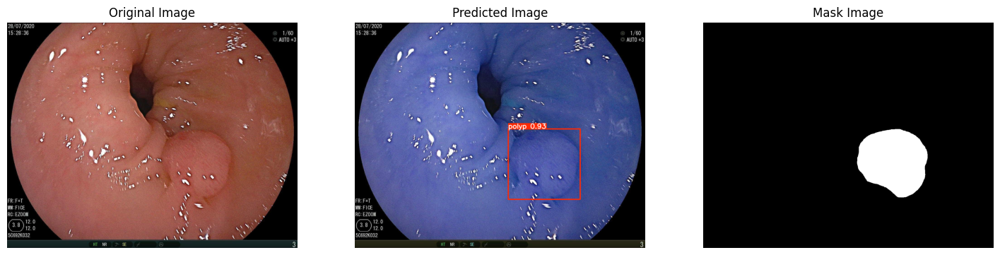

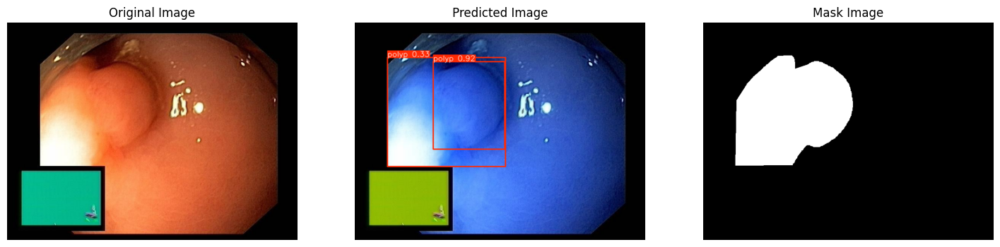

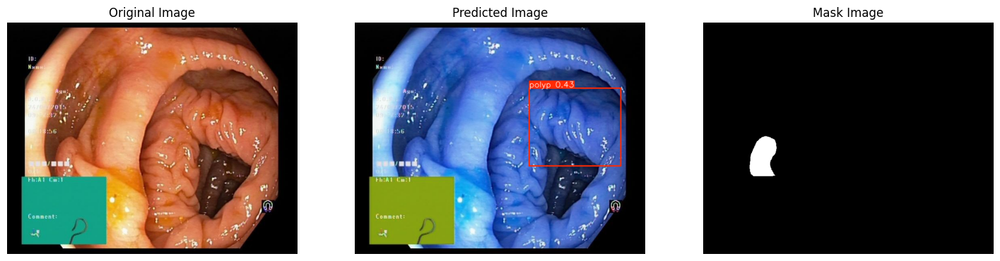

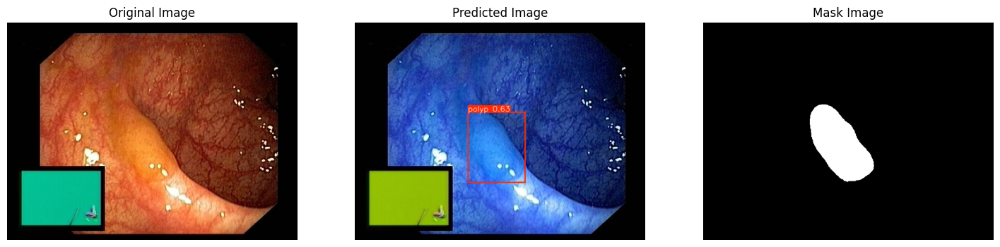

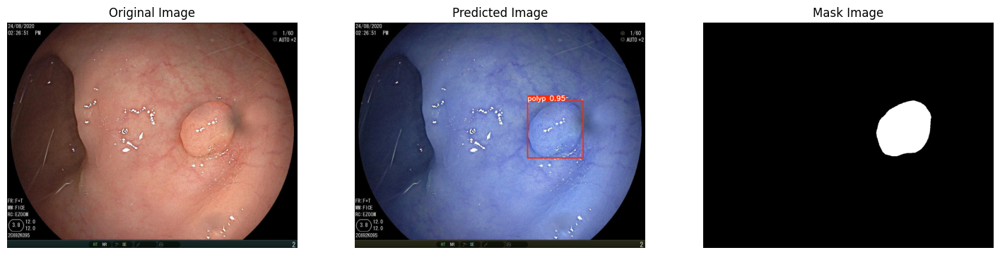

...

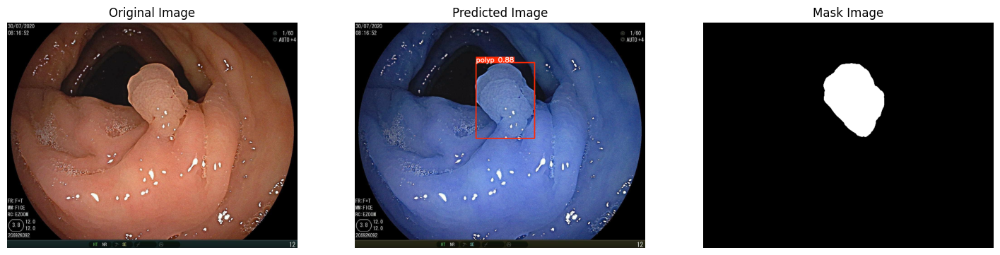

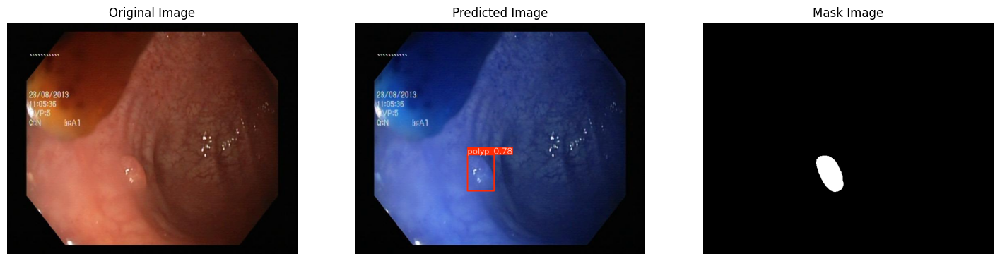

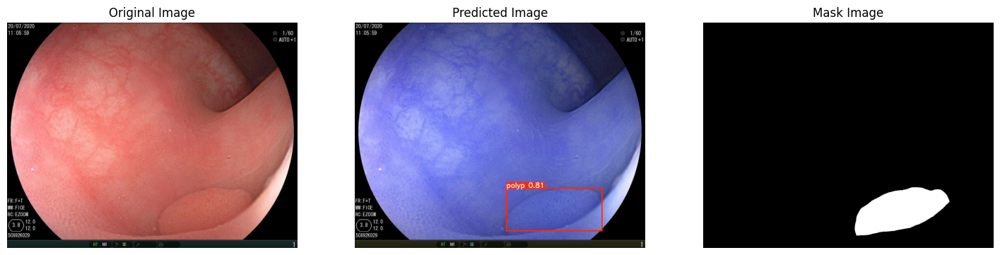

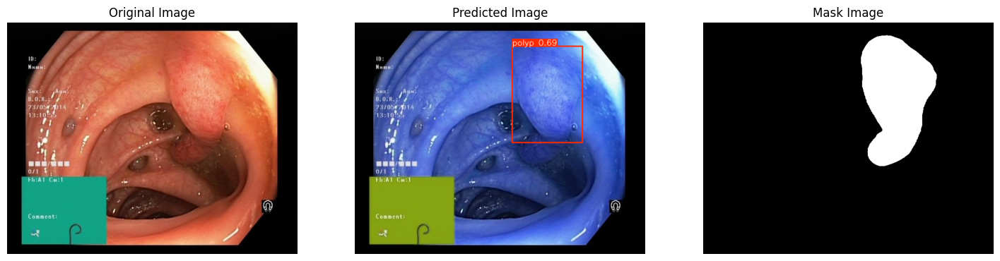

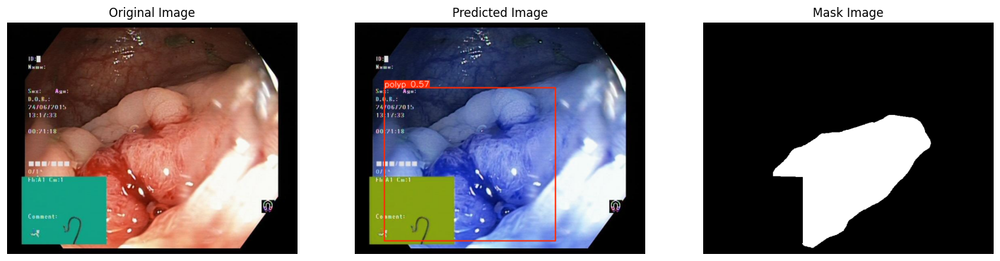

In [33]:
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Load trained model from Kaggle input directory
model_path = '/kaggle/input/yolov9-polyp-best-10epock-pt/yolov9_polyp_best_10epock.pt'
model = YOLO(model_path)

test_img_dir = '/kaggle/working/polyp_yolo_dataset/images/test'
test_mask_dir = '/kaggle/working/polyp_yolo_dataset/masks/test'

output_dir = '/kaggle/working/polyp_yolo_dataset/predictions'
os.makedirs(output_dir, exist_ok=True)

image_files = [f for f in os.listdir(test_img_dir) if f.endswith(('.jpg', '.png'))]
image_files.sort()

for idx, img_name in enumerate(image_files):
    img_path = os.path.join(test_img_dir, img_name)

    # Predict with verbose=False to suppress printing
    results = model.predict(source=img_path, device=0, imgsz=640, verbose=False)
    result = results[0]

    # Convert numpy array from plot() to PIL Image and save
    pred_img_array = result.plot()  # numpy ndarray
    pred_img = Image.fromarray(pred_img_array)
    pred_save_path = os.path.join(output_dir, f'pred_{img_name}')
    pred_img.save(pred_save_path)

    # Display every 20th image
    if idx % 20 == 0:
        # Load original image
        orig_img = Image.open(img_path).convert('RGB')

        # Load corresponding mask image (try .png or .jpg)
        mask_name_png = os.path.splitext(img_name)[0] + '.png'
        mask_name_jpg = os.path.splitext(img_name)[0] + '.jpg'
        mask_path = None
        if os.path.exists(os.path.join(test_mask_dir, mask_name_png)):
            mask_path = os.path.join(test_mask_dir, mask_name_png)
        elif os.path.exists(os.path.join(test_mask_dir, mask_name_jpg)):
            mask_path = os.path.join(test_mask_dir, mask_name_jpg)

        if mask_path:
            mask_img = Image.open(mask_path).convert('L')
        else:
            print(f"Mask not found for {img_name}, skipping mask display.")
            mask_img = None

        # Plot side by side
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))

        axs[0].imshow(orig_img)
        axs[0].set_title('Original Image')
        axs[0].axis('off')

        axs[1].imshow(pred_img)
        axs[1].set_title('Predicted Image')
        axs[1].axis('off')

        if mask_img:
            axs[2].imshow(mask_img, cmap='gray')
            axs[2].set_title('Mask Image')
        else:
            axs[2].text(0.5, 0.5, 'Mask not found', ha='center', va='center', fontsize=12)
        axs[2].axis('off')

        plt.show()
